In [6]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2

In [15]:
angles =  [name for name in os.listdir() if os.path.isdir(name) and not "." in name]
angles.sort()
angles_int = [int(name) for name in angles]
print(angles)
print(angles_int)

['21', '28', '30', '37', '44', '56', '65', '73', '82']
[21, 28, 30, 37, 44, 56, 65, 73, 82]


In [51]:
points4 = []
for angle in angles:
    tmp4 = []
    tmp = os.path.join(angle, 'a.txt')
    tmpfile = open(tmp, 'r')
    
    x1,y1 = tmpfile.readline().split(' ')
    x2,y2 = tmpfile.readline().split(' ')
    x3,y3 = tmpfile.readline().split(' ')
    x4,y4 = tmpfile.readline().split(' ')
    
    
    tmpfile.close()
    points4.append([float(x1),float(y1),
                    float(x2),float(y2),
                    float(x3),float(y3),
                    float(x4),float(y4)])

In [52]:
points4

[[195.40107104051333,
  658.9380917886897,
  341.93183111709004,
  999.1874838309104,
  736.8198116624412,
  999.1874838309104,
  888.3177161483934,
  671.3559528121284],
 [376.7018419827185,
  730.9616857246342,
  418.92256946241014,
  956.9667563512187,
  657.3455011124333,
  966.9010451699698,
  699.5662285921251,
  735.9288301340098],
 [215.2696486780152,
  847.689579344958,
  349.3825477311533,
  1205.323976819993,
  741.7869560718166,
  1202.8404046153053,
  888.3177161483934,
  870.0417291871479],
 [366.7675531639675,
  755.7974077715116,
  413.95542505303456,
  1066.2439333574794,
  697.0826563874373,
  1078.661794380918,
  754.2048170952553,
  765.7316965902626],
 [304.678248046774,
  651.4873751746265,
  376.7018419827185,
  1001.6710560355982,
  642.4440678843068,
  1006.6382004449736,
  659.8290733171211,
  651.4873751746265],
 [324.54682568427586,
  673.8395250168162,
  344.41540332177783,
  1051.342500129353,
  600.2233404046153,
  1068.7275055621672,
  644.9276400889946,

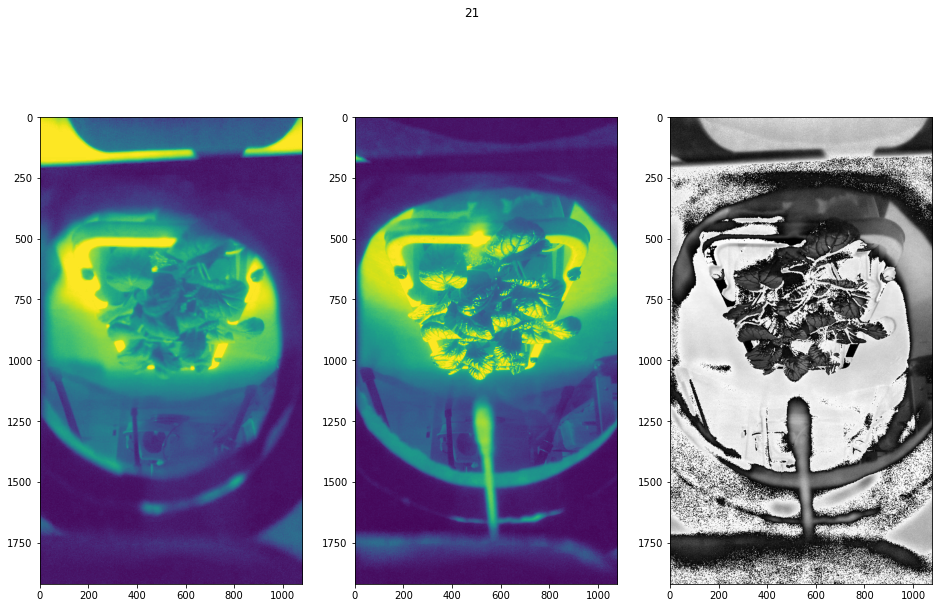

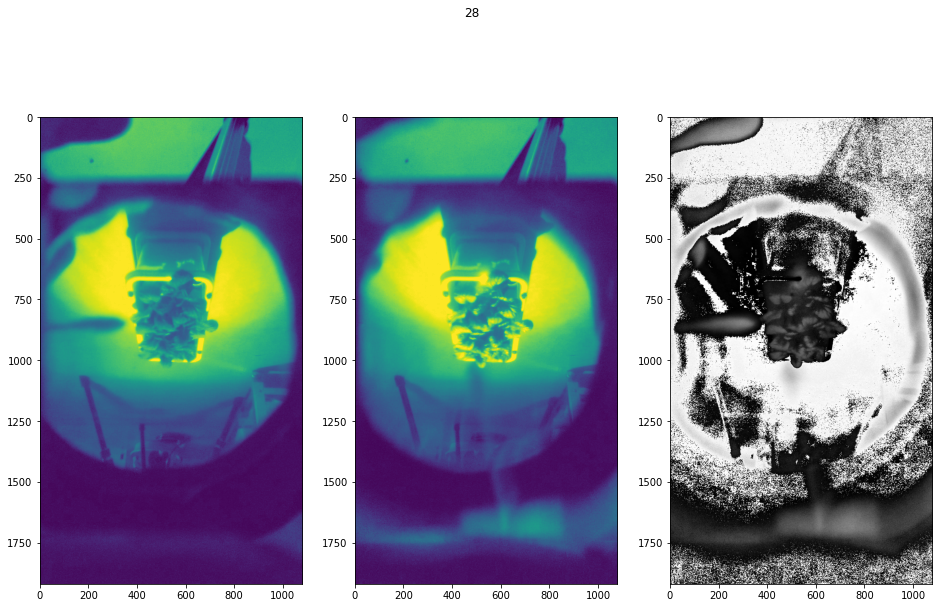

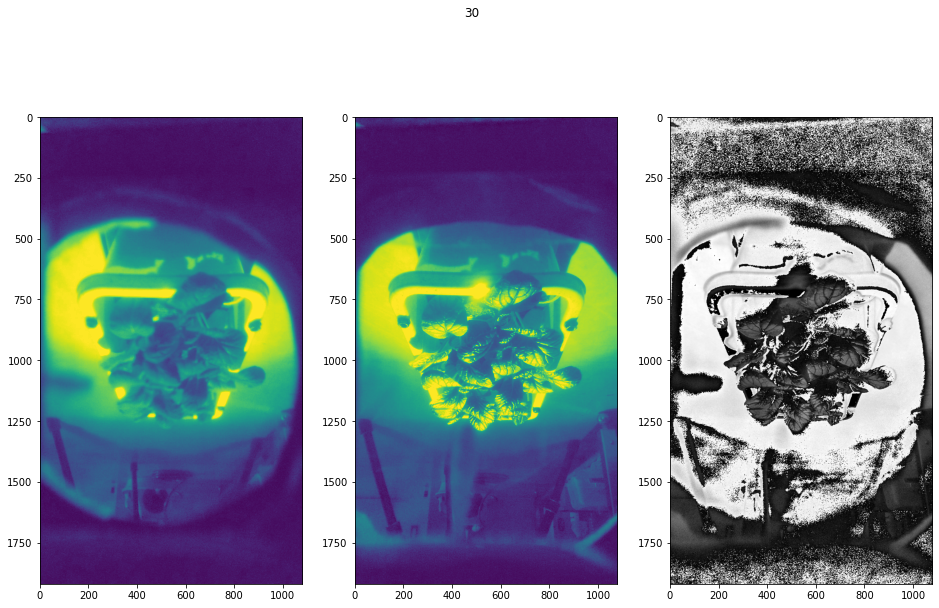

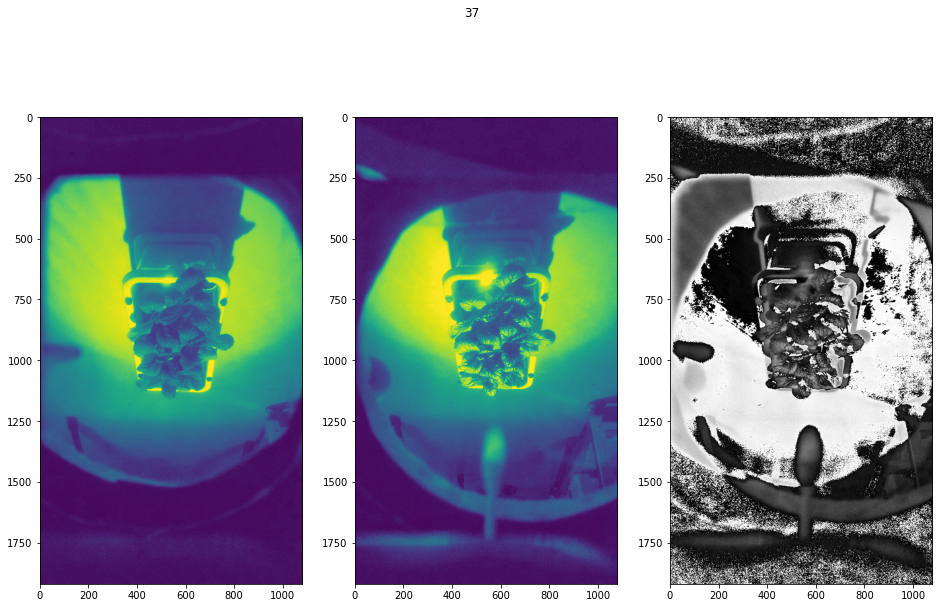

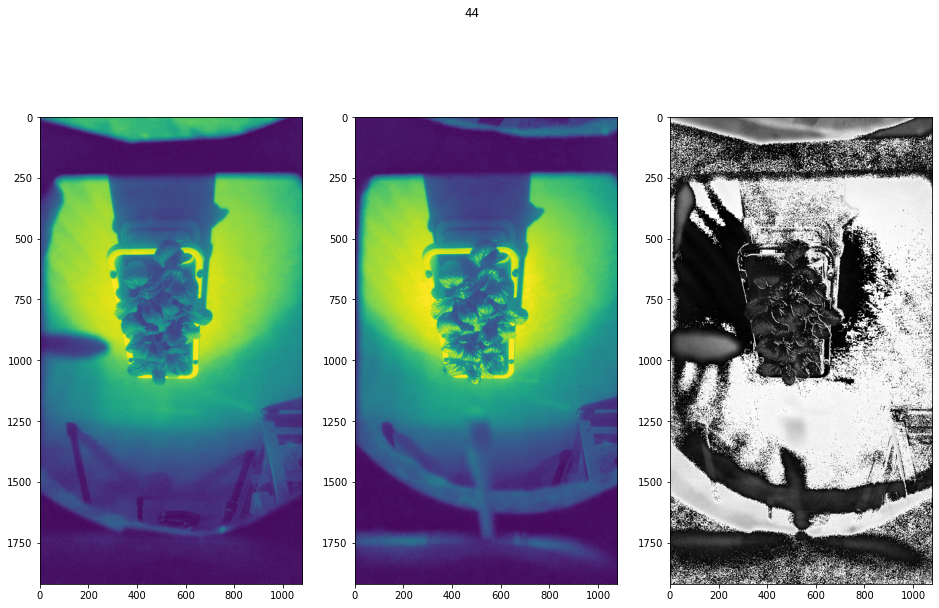

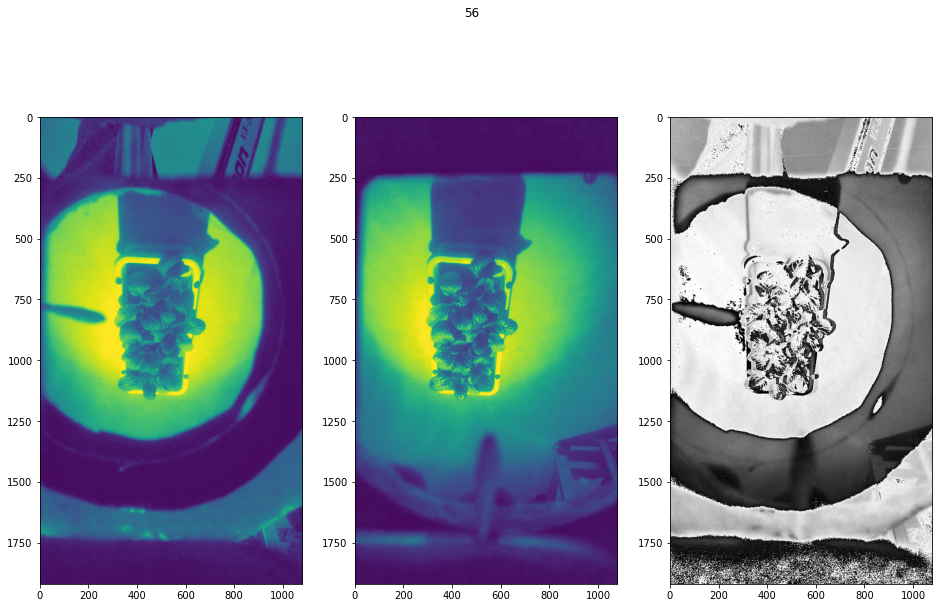

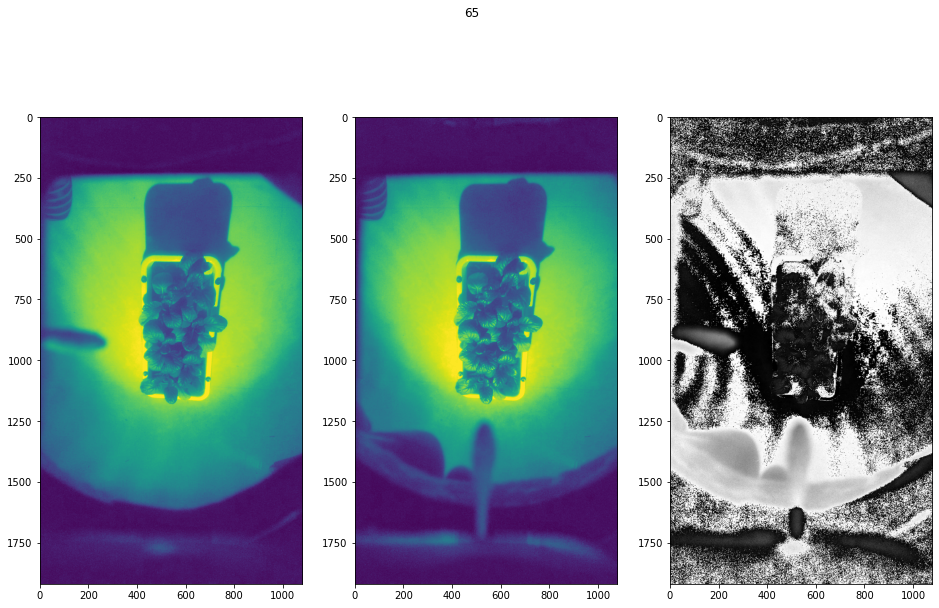

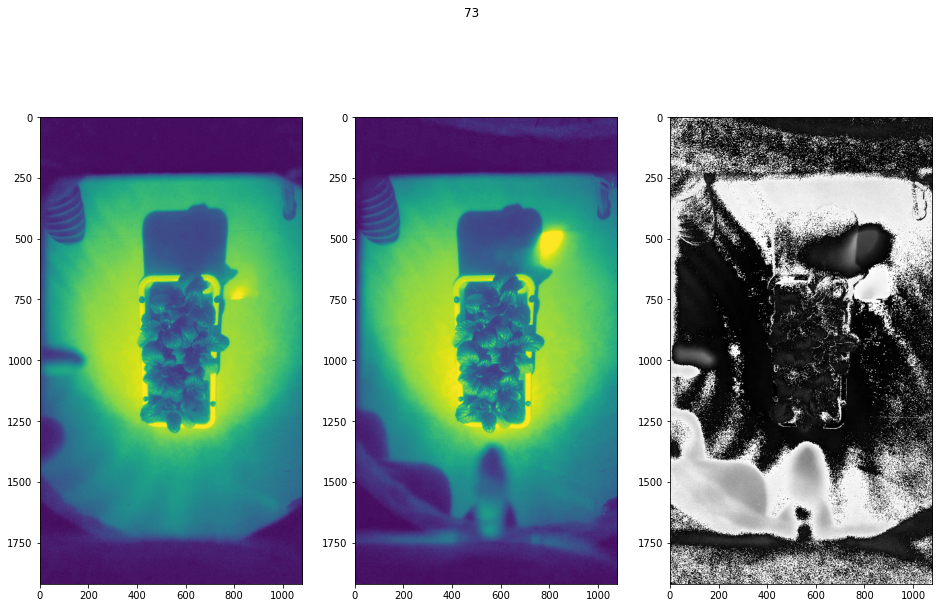

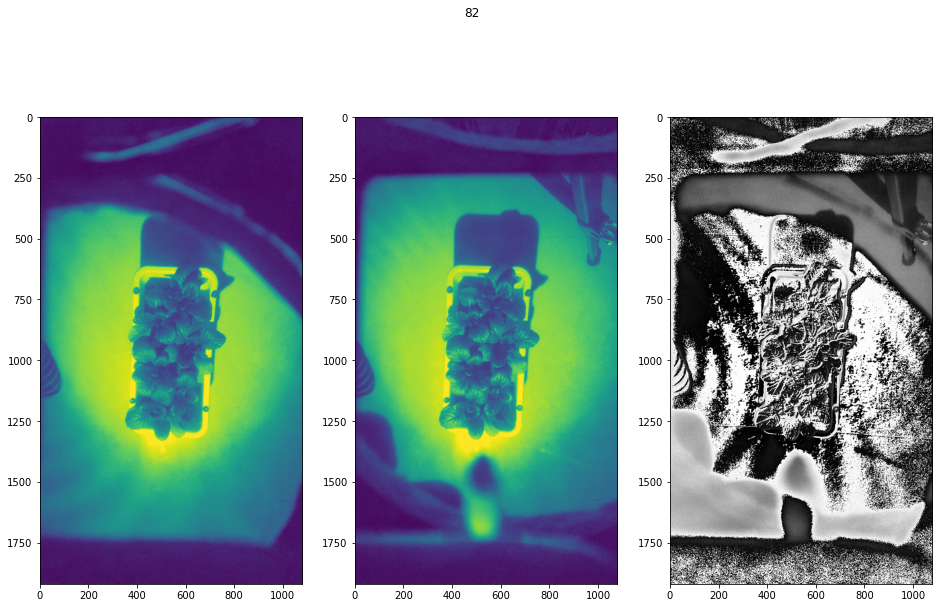

In [25]:
for angle in angles:
    imgx = os.path.join(angle, 'x.jpg')
    imgy = os.path.join(angle, 'y.jpg')
    imgx = plt.imread(imgx)
    imgy = plt.imread(imgy)
    
    fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize = (16,10))    
    fig.suptitle(angle)
    ax1.imshow(imgx[:,:,0])
    ax2.imshow(imgy[:,:,0])
    ax3.imshow(imgy[:,:,0]- imgx[:,:,0], cmap = 'gray')
    

In [29]:
import PIL
from PIL import Image
from PIL import ImageTransform

In [53]:
s = ImageTransform.QuadTransform([195.40107104051333,
  658.9380917886897,
  341.93183111709004,
  999.1874838309104,
  736.8198116624412,
  999.1874838309104,
  888.3177161483934,
  671.3559528121284])

In [54]:
im = Image.open('21/x.jpg')


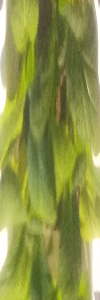

In [57]:
im.transform((100,300), s)

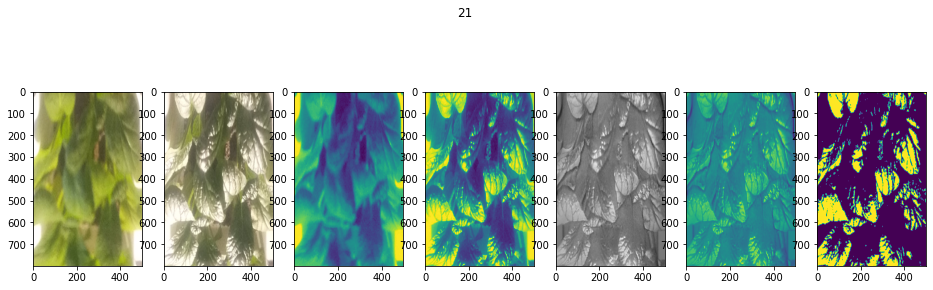

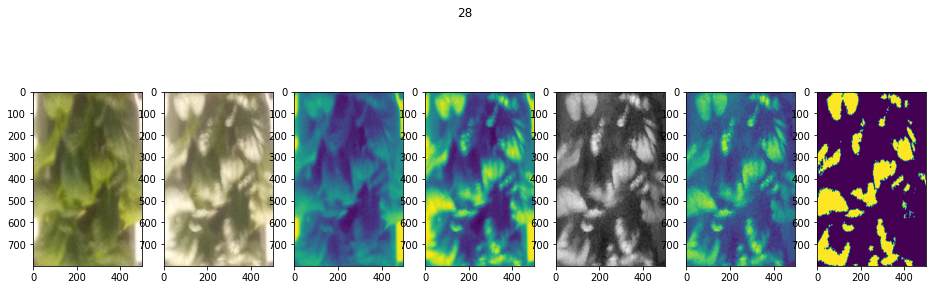

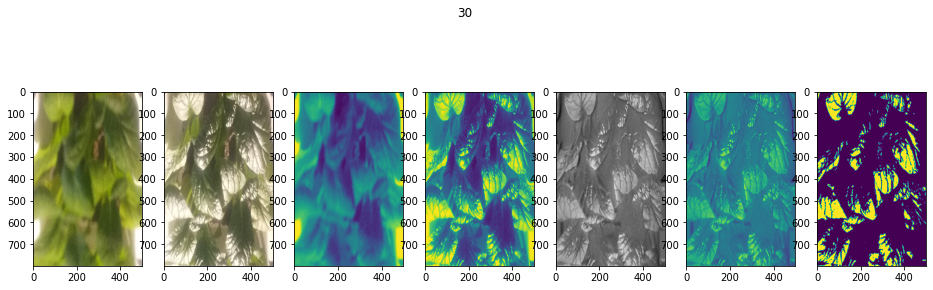

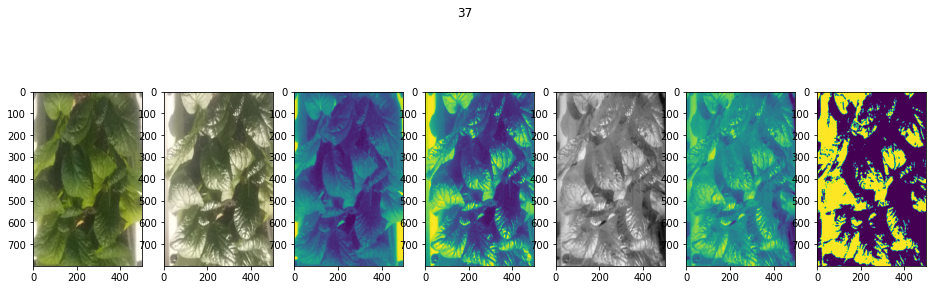

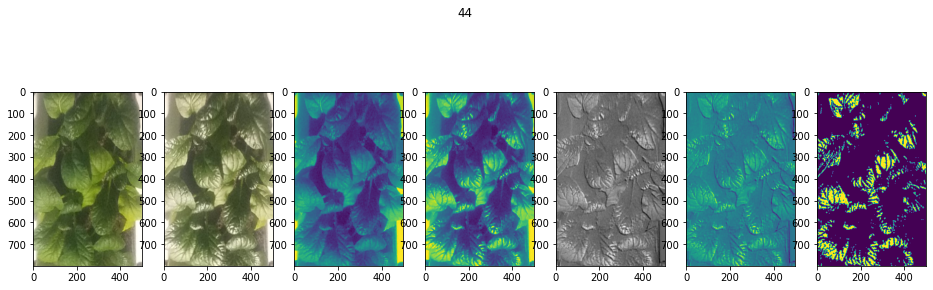

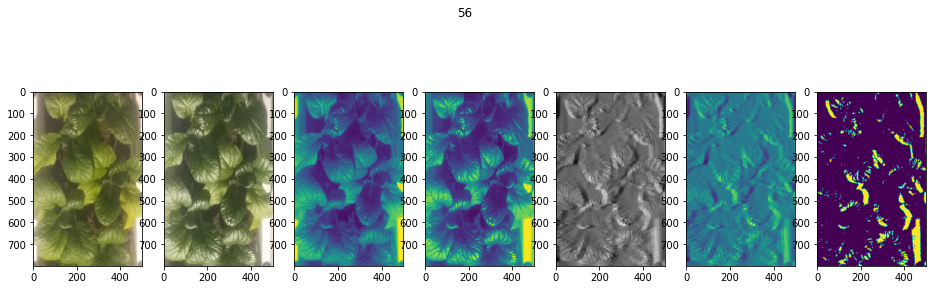

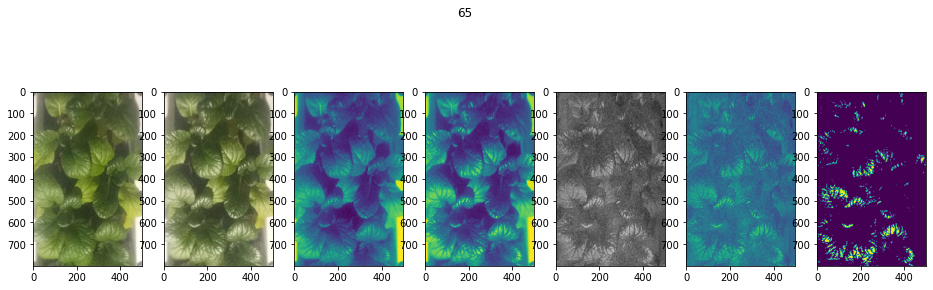

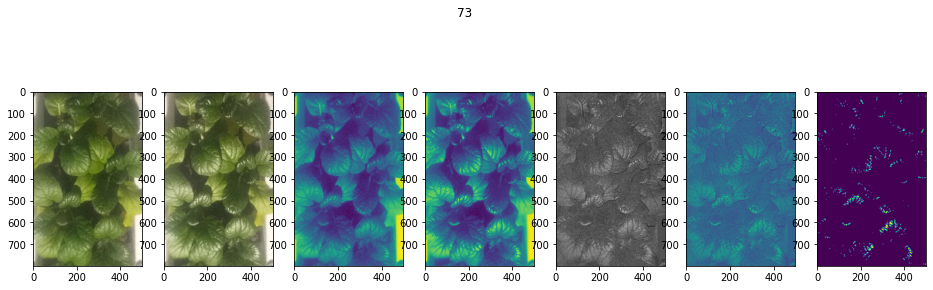

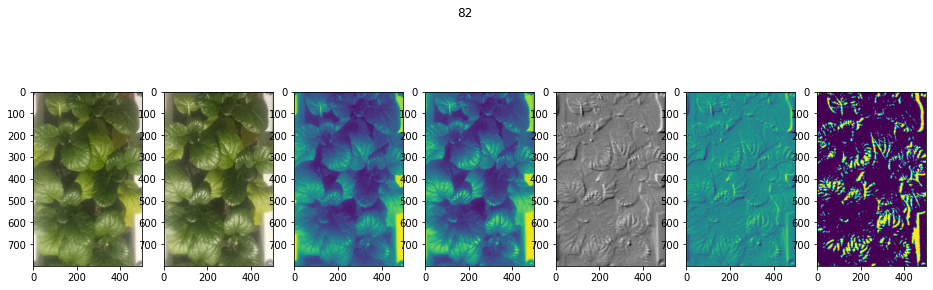

In [86]:
i  = 0 
a=  np.zeros((9, 800, 500))
b=  np.zeros((9, 800, 500))
for angle in angles:
    imgx = Image.open(os.path.join(angle, 'x.jpg'))
    imgy = Image.open(os.path.join(angle, 'y.jpg'))
    
    s = ImageTransform.QuadTransform(points4[i])
    
    imgx_ = imgx.transform((500,800), s)
    imgy_ = imgy.transform((500,800), s)
    fig, (ax1, ax2, ax3,ax4, ax5, ax6,ax7) = plt.subplots(1,7, figsize = (16,5))    
    fig.suptitle(angle)
    ax1.imshow(imgx_)
    ax2.imshow(imgy_)
    
    
    ny = np.array(imgy_)
    nx = np.array(imgx_)
    nyg = ny[:,:,1]
    nxg = nx[:,:,1]
    
    
    
    nyg_norm = (nyg - np.min(nyg))/ (np.max(nyg) - np.min(nyg))
    nxg_norm = (nxg - np.min(nxg))/ (np.max(nxg) - np.min(nxg))
    ax3.imshow(nxg_norm)
    ax4.imshow(nyg_norm)
    
    ax5.imshow(nyg_norm - nxg_norm, cmap = 'gray')
    tmp  = nyg_norm - nxg_norm
    
    a[i,:,:] = (tmp - np.min(tmp)) / (np.max(tmp) - np.min(tmp))
    ax6.imshow(a[i,:,:])
    
    tmpasdf = np.copy(a[i,:,:])
    tmpasdf[np.where(tmpasdf>0.55)] = 1
    tmpasdf[np.where(tmpasdf<=0.55)] = 0
    b[i,:,:] = tmpasdf 
    ax7.imshow(tmpasdf)
    i+=1


In [132]:
out = np.zeros((800,500))
for i in range(800):
    for j in range(500):
        tmpIJ = 0
        tmpIJcount = 0
        for i_ang in range(9):
            tmpIJ += (60 + angles_int[i_ang]/2) * b[i_ang,i,j]
            tmpIJcount += b[i_ang,i,j]

        if tmpIJcount == 0:
            out[i,j] = -1
        else:
            out[i,j] = tmpIJ /tmpIJcount

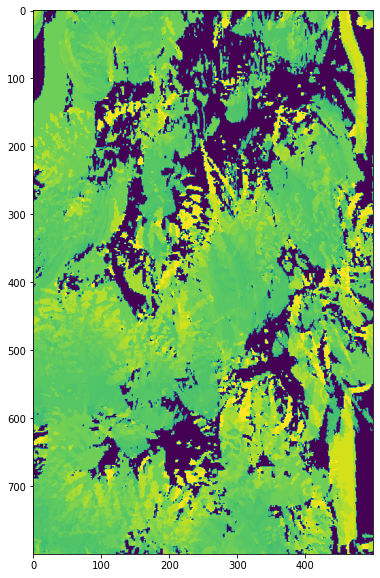

In [136]:
plt.figure(figsize = (10,10))
plt.imshow(out)

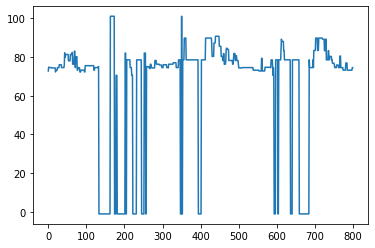

In [137]:
plt.plot(out[:,100])

In [98]:
ith = 100
out[:,ith]

array([16.16666667, 24.88888889, 24.88888889, 24.88888889, 33.11111111,
       33.11111111, 33.11111111, 33.11111111, 33.11111111, 24.77777778,
       24.77777778, 24.77777778, 24.77777778, 24.77777778, 24.77777778,
       24.77777778, 24.77777778, 24.77777778, 24.77777778, 16.05555556,
       24.38888889, 24.38888889, 24.38888889, 24.38888889, 33.11111111,
       33.11111111, 33.11111111, 33.11111111, 33.11111111, 42.22222222,
       42.22222222, 42.22222222, 42.22222222, 42.22222222, 42.22222222,
       33.11111111, 33.11111111, 33.11111111, 33.11111111, 33.11111111,
       33.11111111, 33.11111111, 25.27777778, 36.5       , 44.33333333,
       54.11111111, 54.11111111, 54.11111111, 54.11111111, 63.22222222,
       63.22222222, 63.22222222, 63.22222222, 52.        , 52.        ,
       52.        , 52.        , 52.        , 63.22222222, 63.22222222,
       63.22222222, 63.22222222, 63.22222222, 54.88888889, 33.88888889,
       33.88888889, 33.88888889, 33.88888889, 44.16666667, 55.38

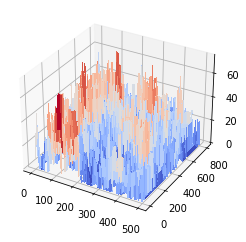

In [105]:
from matplotlib import cm
# Make data.
X = np.arange(0, 500, 1)
Y = np.arange(0, 800, 1)
X, Y = np.meshgrid(X, Y)

fig = plt.figure()
ax = fig.gca(projection='3d')
surf = ax.plot_surface(X, Y, out, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)


In [106]:
np.save("outAngle", out)

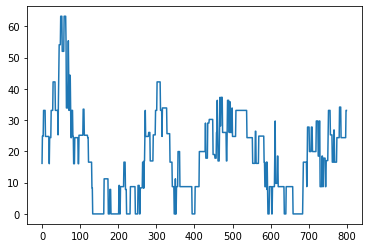

In [107]:
ith = 100
out[:,ith]
plt.plot(out[:,ith])

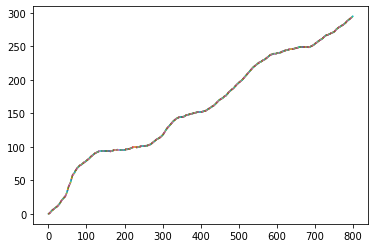

In [109]:
x  = 0
y  = 0
tmpVeritcal = np.zeros((800, 1 ))
for i in range(800):
    tmpVeritcal[i,0] = x
    slopes = out[i,ith]
    x1 = x +1
    y1 = y + np.tan(slopes/180*np.pi)
    plt.plot([x,x1],[y, y1])
    x=  x1
    y = y1

In [133]:
threeDsurface = np.zeros((800,500))
for j in range(500):
    x  = 0
    y  = 0
    tmpVeritcal = np.zeros((800, 1 ))
    for i in range(800):
        tmpVeritcal[i,0] = y
        slopes = out[i,j]
        if slopes == -1:
            y = 0
        x1 = x +1
        y1 = y + np.tan(slopes/180*np.pi)
#         plt.plot([x,x1],[y, y1])
        x=  x1
        y = y1
    threeDsurface[:, j] = tmpVeritcal[:,0]

In [134]:
np.save('threeDsurface', threeDsurface)

In [121]:
tmpVeritcal.resize(800,1)

In [120]:
tmpVeritcal

array([[0.00000000e+00],
       [2.89896082e-01],
       [7.53844938e-01],
       [1.21779379e+00],
       [1.68174265e+00],
       [2.33391082e+00],
       [2.98607899e+00],
       [3.63824716e+00],
       [4.29041533e+00],
       [4.94258350e+00],
       [5.40417780e+00],
       [5.86577209e+00],
       [6.32736639e+00],
       [6.78896068e+00],
       [7.25055498e+00],
       [7.71214928e+00],
       [8.17374357e+00],
       [8.63533787e+00],
       [9.09693216e+00],
       [9.55852646e+00],
       [9.84632149e+00],
       [1.02997078e+01],
       [1.07530941e+01],
       [1.12064804e+01],
       [1.16598667e+01],
       [1.23120349e+01],
       [1.29642031e+01],
       [1.36163712e+01],
       [1.42685394e+01],
       [1.49207076e+01],
       [1.58281592e+01],
       [1.67356108e+01],
       [1.76430624e+01],
       [1.85505140e+01],
       [1.94579656e+01],
       [2.03654173e+01],
       [2.10175854e+01],
       [2.16697536e+01],
       [2.23219218e+01],
       [2.29740899e+01],


In [125]:
threeDsurface

array([[0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [2.89896082e-01, 2.89896082e-01, 2.89896082e-01, ...,
        2.89896082e-01, 2.89896082e-01, 2.89896082e-01],
       [7.53844938e-01, 7.53844938e-01, 7.53844938e-01, ...,
        7.53844938e-01, 7.53844938e-01, 7.53844938e-01],
       ...,
       [2.93221100e+02, 2.93221100e+02, 2.93221100e+02, ...,
        2.93221100e+02, 2.93221100e+02, 2.93221100e+02],
       [2.93674486e+02, 2.93674486e+02, 2.93674486e+02, ...,
        2.93674486e+02, 2.93674486e+02, 2.93674486e+02],
       [2.94326654e+02, 2.94326654e+02, 2.94326654e+02, ...,
        2.94326654e+02, 2.94326654e+02, 2.94326654e+02]])